# Working with the datasets from which we already know the probability of the outcomes

In [21]:
import numpy as np
import pandas as pd
from scipy.special import expit   # the sigmoid function
from sklearn.linear_model import LogisticRegression
from sklearn.calibration import calibration_curve
import matplotlib.pyplot as plt
import matplotlib as mpl

**The *Calibration Curve* (first plot)**  
* **What it shows:**
  You take your predicted probabilities $\hat s(x_i)$, sort them into (say) 10 equal-width bins, and in each bin you plot

  $$
    \bigl(\text{mean predicted probability in the bin},\;\text{observed fraction of }D=1\text{ in that bin}\bigr).
  $$
* **Why it’s useful:**
  This is exactly what you can do on *real* data (where you only have 0/1 outcomes).  If your points lie on the 45° line, it means “among all the examples I said 0.6, about 60% actually had $D=1$.”  It’s a binned, empirical check of calibration.


**The *Predicted vs. True Probability Scatter* (second plot)**  
* **What it shows:**
  Since this is *synthetic* data, you actually know the “ground-truth” $p_i=\sigma(\eta_i)$ that generated each label.  Here each dot is one $(p_i,\;\hat s(x_i))$ pair, so you get a full scatter of predictions against their true values.
* **Why it’s useful:**
  It gives you a pointwise, high-resolution picture of how close $\hat s$ is to the actual DGP probability.  You can literally see the spread around the diagonal and even compute an MSE $\frac1n\sum (p_i-\hat s_i)^2$.  You can only do this when you’re in a simulation and know the true $p_i$.


In short, the *Calibration curve* is a *binned* check of $\hat s$ vs. observed frequency of $D$, usable on real data. And the *Scatter vs. true* is a *pointwise* check of $\hat s$ vs. the *known* $p$ in your synthetic experiment.


## Dataset similar to `make_circles` but knowing the real probabilities

* **Features**:
  $X_1,X_2\sim N(0,1)$.

* **Probability**:

  $$
    p_i = \frac{1}{1 + \exp\bigl[-\alpha\,(X_{1,i}^2 + X_{2,i}^2 - r_0)\bigr]}
    \quad\text{with}\ \alpha=5.0,\ r_0=1.0.
  $$

* **Outcome**:
  $y_i\sim\mathrm{Bernoulli}(p_i)$.

The scatter plot above shows the two “classes” (inner circle vs. outer) generated by sampling points from those ring‐shaped probabilities.


In our synthetic-circle generator, we set

$$
p_i = \sigma\bigl(\alpha\,(X_{1,i}^2 + X_{2,i}^2 - r_0)\bigr)
$$

where $\sigma(z)=1/(1+e^{-z})$.

* **$r_0$** is the “radius threshold.”  Since $X_1^2+X_2^2$ is the squared distance from the origin, when $X_1^2+X_2^2 = r_0$ the argument to the sigmoid is zero, so $p_i = 0.5$.  Points *inside* that circle ($<r_0$) get $p<0.5$, points *outside* ($>r_0$) get $p>0.5$.

* **$\alpha$** controls the **steepness** of the transition from low to high probability.

  * If $\alpha$ is very large, the sigmoid becomes almost a step at radius $\sqrt{r_0}$: points just inside get $p\approx0$ and just outside get $p\approx1$.
  * If $\alpha$ is small, the transition is more gradual, so you’ll see a fuzzy band around the circle where $p$ moves smoothly from 0 toward 1.

By tweaking $r_0$ you move the circle’s radius, and by tweaking $\alpha$ you make the “ring boundary” sharper or softer.


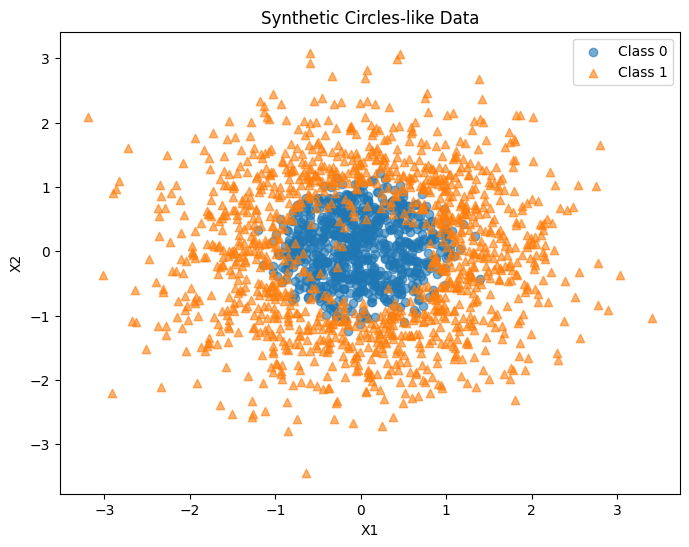

In [1]:
import numpy as np
import matplotlib.pyplot as plt

# 1) PARAMETERS
n = 2000
alpha = 5.0  # controls sharpness of the circle boundary
r0 = 1    # target radius

# 2) SIMULATE FEATURES
X1 = np.random.randn(n)
X2 = np.random.randn(n)
r2 = X1**2 + X2**2

# 3) DEFINE TRUE PROBABILITIES USING A SIGMOID ON r^2 - r0
p = 1 / (1 + np.exp(-alpha * (r2 - r0)))

# 4) SAMPLE OUTCOME y ~ Bernoulli(p)
y = np.random.binomial(1, p)

# 5) SCATTER PLOT
classes = np.unique(y)
plt.figure(figsize=(8,6))
for cls, marker in zip(classes, ['o','^']):
    plt.scatter(
        X1[y==cls], 
        X2[y==cls], 
        alpha=0.6, 
        marker=marker, 
        label=f'Class {int(cls)}')

plt.legend()
plt.xlabel('X1')
plt.ylabel('X2')
plt.title('Synthetic Circles-like Data')
plt.show()


In [6]:
(y.sum()) / 2000

0.6285

In [8]:
# Full dataset
X = np.column_stack((X1, X2))   # now X has shape (n,2)
# extend X with that third column
X_ext = np.column_stack((X, r2))  # shape (n,3)
X_ext

array([[-0.8350023 ,  1.12283217,  1.95798092],
       [ 0.09495882,  0.26361802,  0.07851164],
       [ 1.38807548,  0.08484162,  1.93395163],
       ...,
       [ 0.94862593,  1.02159011,  1.9435375 ],
       [-0.85600885, -1.54101976,  3.10749304],
       [ 0.06079676,  0.25765566,  0.07008268]])

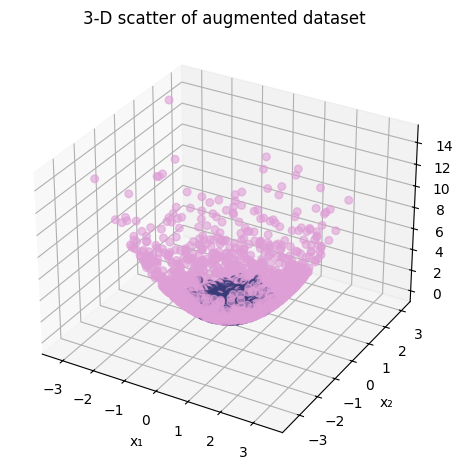

In [9]:
fig = plt.figure()
ax = fig.add_subplot(projection='3d')

# X_ext  → shape (n_samples, 3)
# y      → 1-D array of class labels you got from make_blobs
ax.scatter(X_ext[:, 0], X_ext[:, 1], X_ext[:, 2], c=y, alpha=0.6, cmap=plt.cm.tab20b, s=30)

ax.set_xlabel("x₁")
ax.set_ylabel("x₂")
ax.set_zlabel("x₁² + x₂²")
plt.title("3-D scatter of augmented dataset")
plt.tight_layout()
plt.show()

In [10]:
import numpy as np
import matplotlib.pyplot as plt
import logitboost_j_implementation as logitboost
import calibration_functions as calibration
from sklearn.model_selection import train_test_split
from sklearn.datasets import make_circles
from sklearn.metrics import accuracy_score, roc_auc_score, log_loss
import lmt_final_implementation as lmt
from sklearn import tree

In [11]:
# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_ext, y, test_size=0.3, random_state=42)

### LogitBoost *J* classes

In [7]:
# Fit the LogitBoost model
learners1, J1 = logitboost.logitboost_fit(X_train[:,:2], y_train, n_estimators=500)

# Predict using the fitted model on test set
y_pred1 = logitboost.logitboost_predict(X_test[:,:2], learners1, J1)
y_proba1 = logitboost.logitboost_predict_proba(X_test[:,:2], learners1, J1)

# Evaluate the model
acc1 = accuracy_score(y_test, y_pred1)
roc1 = roc_auc_score(y_test, y_proba1[:, 1])
log_loss1 = log_loss(y_test, y_proba1)

# Print results for original make_circles
print(f"Log-loss on original make_circles: {log_loss1:.4f}")
print(f"Accuracy on original make_circles: {acc1:.4f}")
print(f"ROC AUC on original make_circles: {roc1:.4f}")

Log-loss on original make_circles: 0.6694
Accuracy on original make_circles: 0.6117
ROC AUC on original make_circles: 0.5053


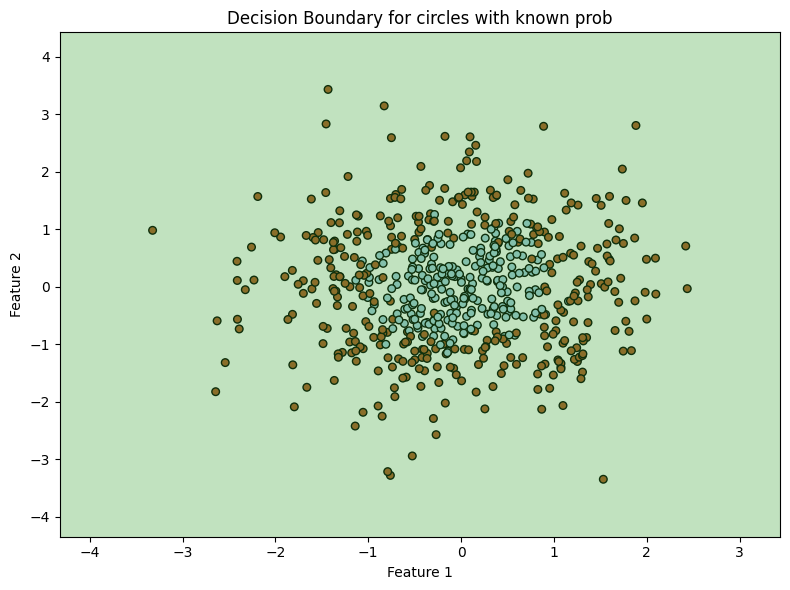

In [8]:
logitboost.plot_decision_boundary(X_test[:,:2], y_test, learners1, J1,
                       title="Decision Boundary for circles with known prob")

In [9]:
# Fit the LogitBoost model
learners2, J2 = logitboost.logitboost_fit(X_train, y_train, n_estimators=500)

# Predict using the fitted model on test set
y_pred2 = logitboost.logitboost_predict(X_test, learners2, J2)
y_proba2 = logitboost.logitboost_predict_proba(X_test, learners2, J2)

# Evaluate the model
acc2 = accuracy_score(y_test, y_pred2)
log_loss2 = log_loss(y_test, y_proba2)
roc2 = roc_auc_score(y_test, y_proba2[:, 1])

# Print results for extended make_circles
print(f"Log-loss on extended make_circles: {log_loss2:.4f}")
print(f"Accuracy on extended make_circles: {acc2:.4f}")
print(f"ROC AUC on extended make_circles: {roc2:.4f}")

Log-loss on extended make_circles: 0.2059
Accuracy on extended make_circles: 0.9083
ROC AUC on extended make_circles: 0.9726


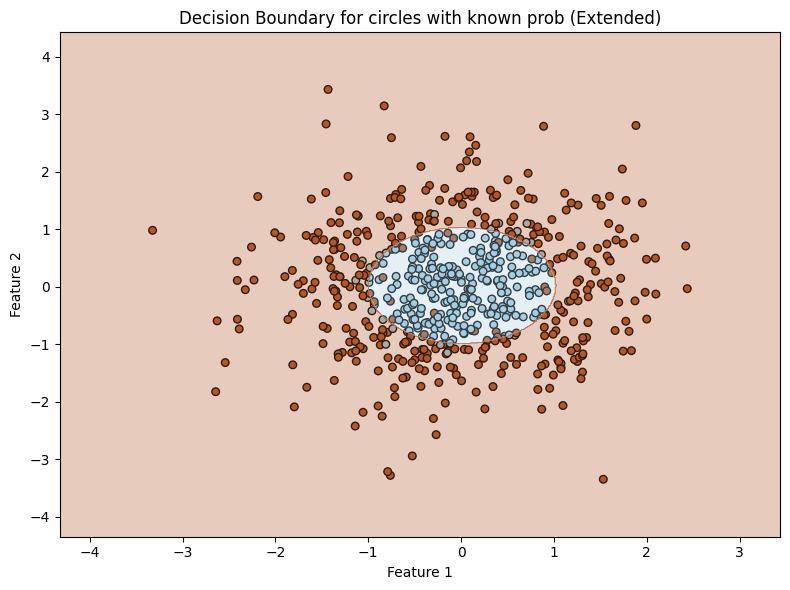

In [10]:
logitboost.plot_decision_boundary(X_test, y_test, learners2, J2,
                       title="Decision Boundary for circles with known prob (Extended)",)

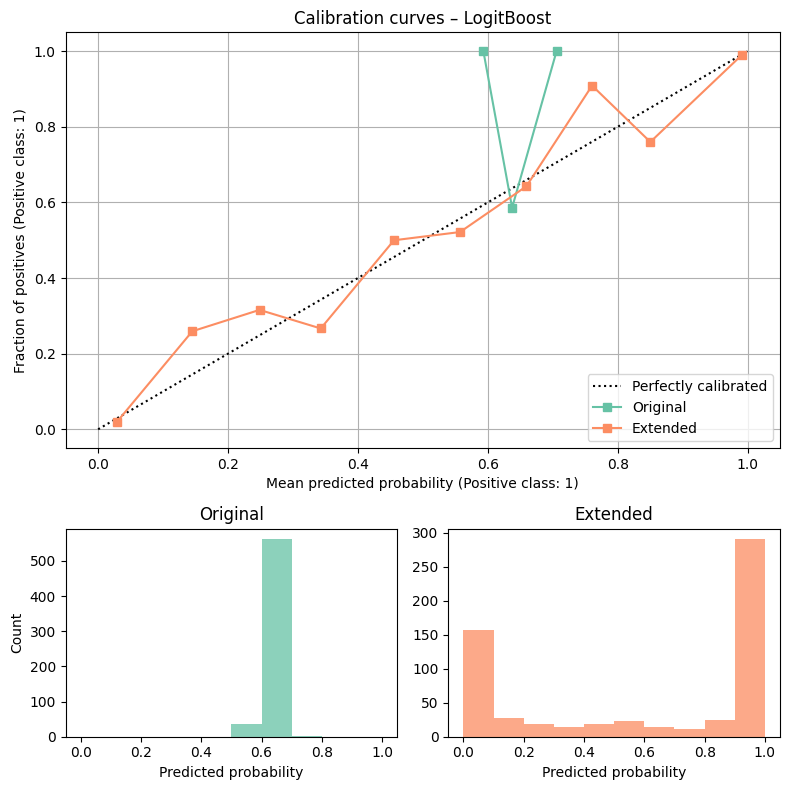

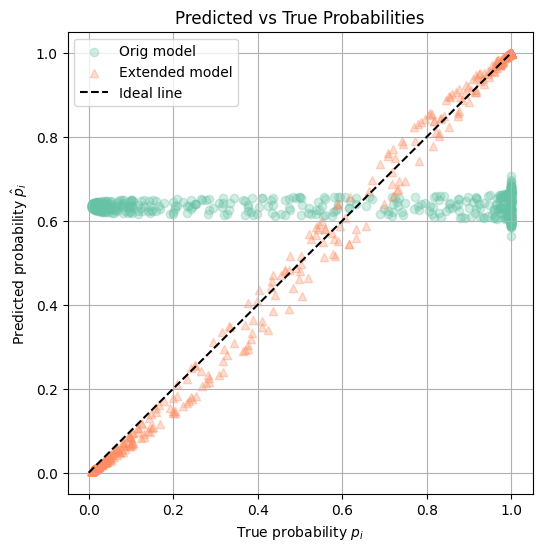

In [11]:
from sklearn.calibration import CalibrationDisplay
from matplotlib.gridspec import GridSpec
# --- 1) recover true p_i on the test set --------------------
# assuming X_test is shape (n_test,2) for the original features
# and your true probabilities only depend on x1^2 + x2^2:
r2_test = X_test[:,0]**2 + X_test[:,1]**2
p_true  = expit(alpha * (r2_test - r0))

# --- 2) calibration curves (10 bins) ------------------------
# Get class-probability estimates for each model
#  -> keep only the probability of the positive class (column 1)
proba_orig = logitboost.logitboost_predict_proba(X_test[:,:2], learners1, J1)[:, 1]
proba_ext  = logitboost.logitboost_predict_proba(X_test, learners2, J2)[:, 1]

fig = plt.figure(figsize=(8, 8))
gs  = GridSpec(nrows=2, ncols=2, height_ratios=[2, 1])

ax_curve = fig.add_subplot(gs[0, :])                 # big panel for the curves
ax_hist1 = fig.add_subplot(gs[1, 0])                 # histogram – model 1
ax_hist2 = fig.add_subplot(gs[1, 1])                 # histogram – model 2
colors   = plt.get_cmap("Set2")

# ―― Curve for the ORIGINAL data ――
CalibrationDisplay.from_predictions(
    y_test,           # true labels (binary, 0 / 1)
    proba_orig,       # predicted prob of class 1
    n_bins=10,
    name="Original",
    ax=ax_curve,
    color=colors(0),
)

# ―― Curve for the EXTENDED data ――
CalibrationDisplay.from_predictions(
    y_test,
    proba_ext,
    n_bins=10,
    name="Extended",
    ax=ax_curve,
    color=colors(1),
)

ax_curve.set_title("Calibration curves – LogitBoost")
ax_curve.grid(True)
ax_hist1.hist(proba_orig, bins=10, range=(0, 1),
              color=colors(0), alpha=0.75)
ax_hist1.set(title="Original", xlabel="Predicted probability", ylabel="Count")

ax_hist2.hist(proba_ext,  bins=10, range=(0, 1),
              color=colors(1), alpha=0.75)
ax_hist2.set(title="Extended", xlabel="Predicted probability")

fig.tight_layout()
plt.show()

# --- 3) Predicted vs True probability scatter ---------------
plt.figure(figsize=(6,6))
plt.scatter(p_true, y_proba1[:,1], alpha=0.3, marker='o', label='Orig model', color=colors(0))
plt.scatter(p_true, y_proba2[:,1], alpha=0.3, marker='^', label='Extended model', color=colors(1))
plt.plot([0,1],[0,1],'k--',label='Ideal line')
plt.xlabel('True probability $p_i$')
plt.ylabel('Predicted probability $\hat p_i$')
plt.title('Predicted vs True Probabilities')
plt.legend()
plt.grid(True)
plt.show()

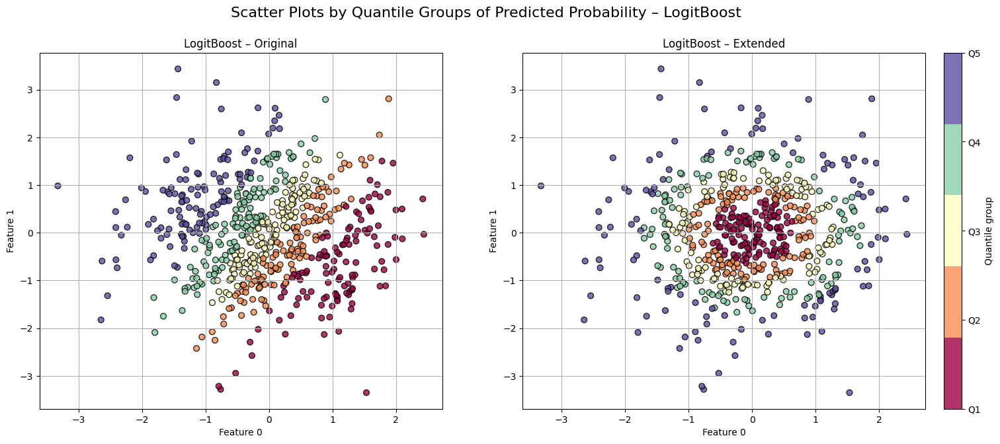

In [18]:
# Get the probabilities of the positive class
y_proba1 = logitboost.logitboost_predict_proba(X_test[:, :2], learners1, J1)[:, 1]
y_proba2 = logitboost.logitboost_predict_proba(X_test,     learners2, J2)[:, 1]

# Define grid
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(18, 7))

# Scatter plot for the original model
scatter1 = calibration.plot_scatter_by_quantile(
    X_test[:, :2],
    y_proba1,
    n_quantiles=5,
    title="LogitBoost – Original",
    ax=axes[0],
    cmap="Spectral"
)

# Scatter plot for the extended model
scatter2 = calibration.plot_scatter_by_quantile(
    X_test[:, :2],   # seguimos usando sólo las dos primeras dimensiones
    y_proba2,
    n_quantiles=5,
    title="LogitBoost – Extended",
    ax=axes[1],
    cmap="Spectral"
)

# Color bar
cbar = fig.colorbar(
    scatter2,
    ax=axes,
    orientation="vertical",
    fraction=0.02,
    pad=0.02
)
cbar.set_label("Quantile group")
cbar.set_ticks(range(5))
cbar.set_ticklabels([f"Q{i+1}" for i in range(5)])

fig.suptitle("Scatter Plots by Quantile Groups of Predicted Probability – LogitBoost", fontsize=16)
plt.show()


### Decision Trees $C4.5$

Shallow Tree (No Pruning) - Accuracy: 0.6683, AUC: 0.7282, Log Loss: 0.5090
Regular Tree (No Pruning) - Accuracy: 0.8917, AUC: 0.9325, Log Loss: 1.8523
Overfit Tree (No Pruning) - Accuracy: 0.8917, AUC: 0.8856, Log Loss: 3.9047
Regular Tree (With Pruning) - Accuracy: 0.8817, AUC: 0.9455, Log Loss: 0.2909


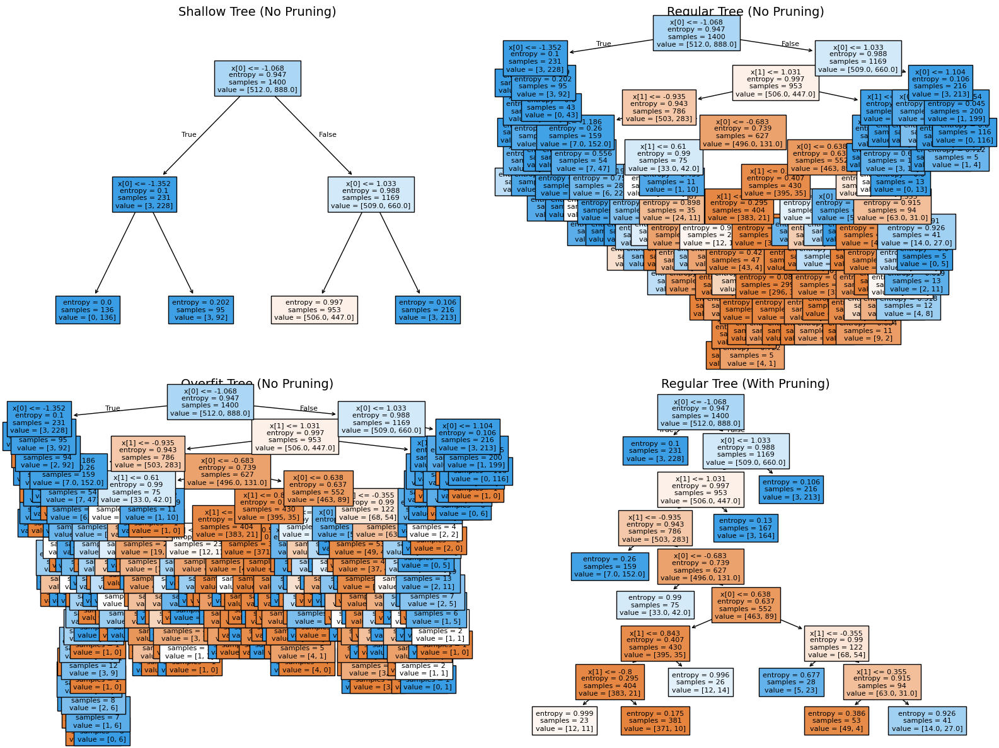

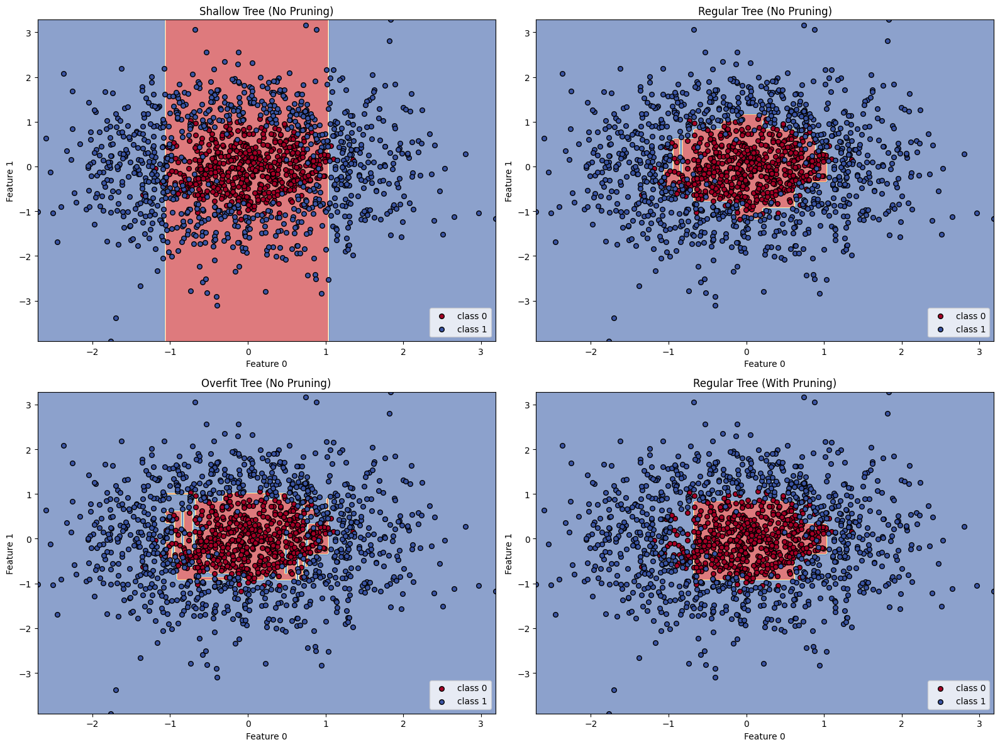

In [13]:
lmt.compare_tree_variants(X_train[:,:2], X_test[:,:2], y_train, y_test, lmt, decision=True)

Shallow Tree (No Pruning) - Accuracy: 0.9067, AUC: 0.9623, Log Loss: 0.2270
Regular Tree (No Pruning) - Accuracy: 0.9000, AUC: 0.9416, Log Loss: 1.3933
Overfit Tree (No Pruning) - Accuracy: 0.8650, AUC: 0.8520, Log Loss: 4.8659
Regular Tree (With Pruning) - Accuracy: 0.9067, AUC: 0.9623, Log Loss: 0.2270


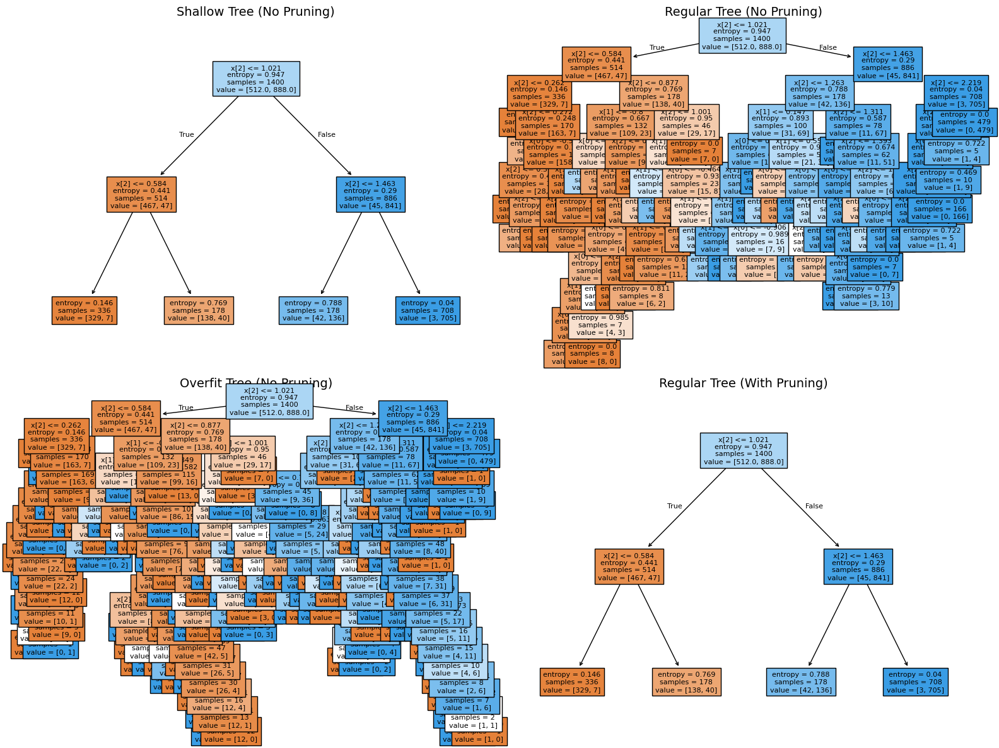

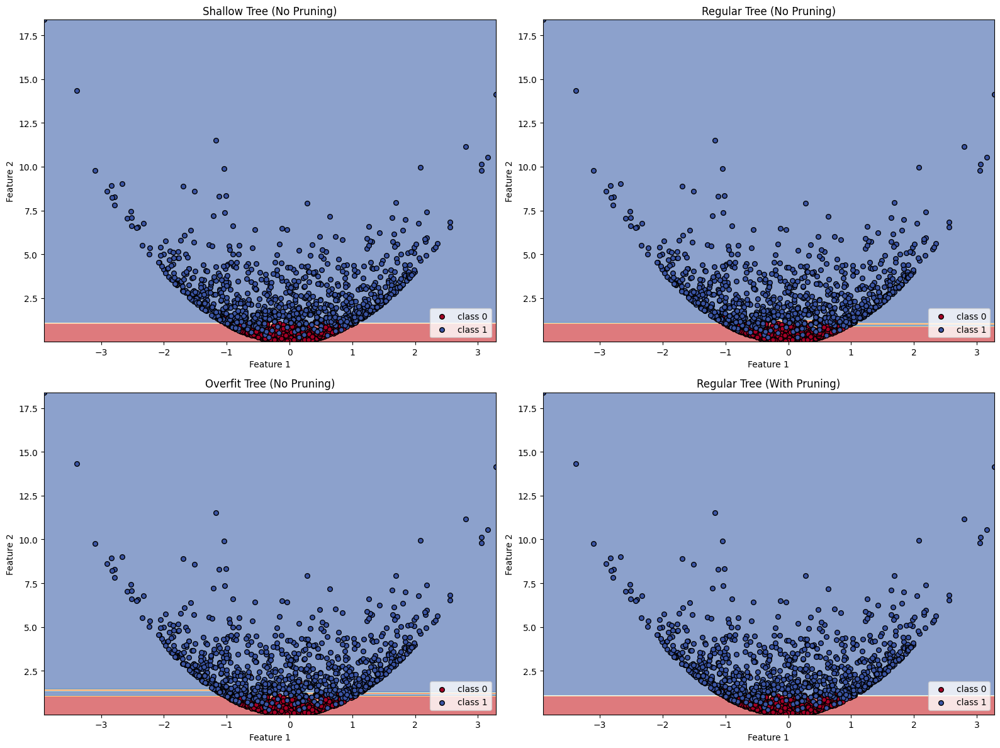

In [14]:
lmt.compare_tree_variants(X_train, X_test, y_train, y_test, lmt, decision=True, feature_pair=(1,2))

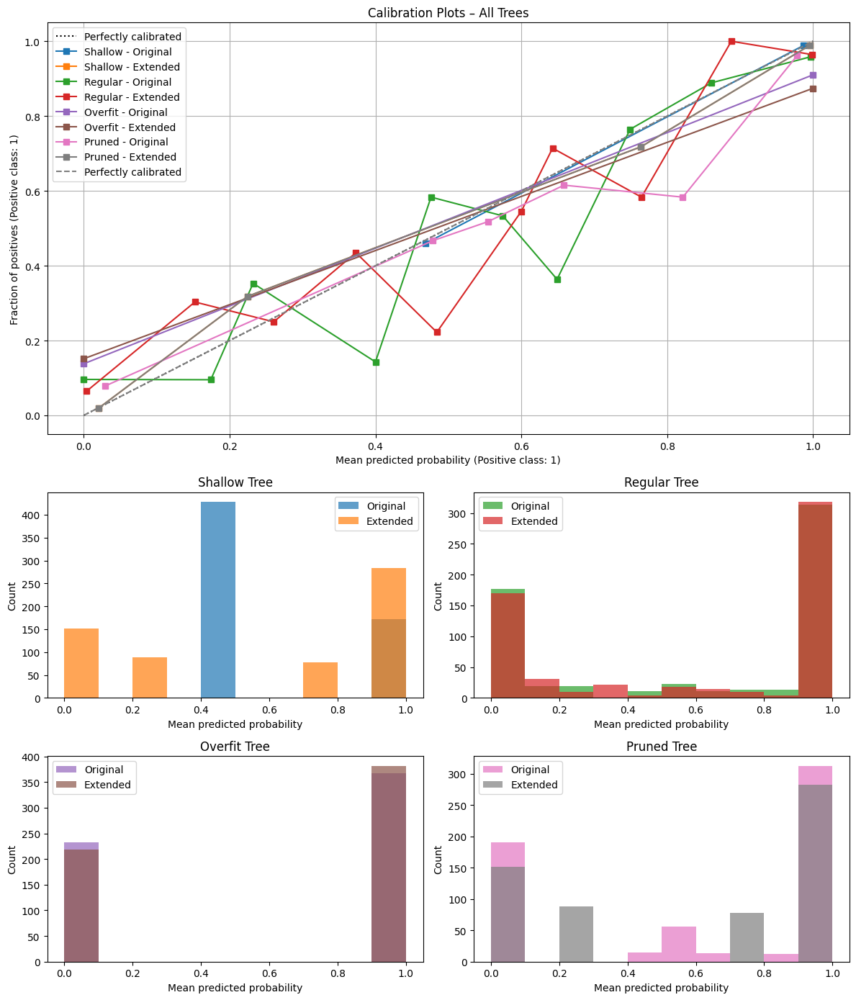

In [15]:
clf_shallow     = lmt.construct_tree(X_train[:,:2],     y_train,     size='shallow', pruning=False)
clf_regular     = lmt.construct_tree(X_train[:,:2],     y_train,     size='regular', pruning=False)
clf_overfit     = lmt.construct_tree(X_train[:,:2],     y_train,     size='overfit', pruning=False)
clf_pruned      = lmt.construct_tree(X_train[:,:2],     y_train,     size='regular', pruning=True)

clf_shallow_ext = lmt.construct_tree(X_train, y_train, size='shallow', pruning=False)
clf_regular_ext = lmt.construct_tree(X_train, y_train, size='regular', pruning=False)
clf_overfit_ext = lmt.construct_tree(X_train, y_train, size='overfit', pruning=False)
clf_pruned_ext  = lmt.construct_tree(X_train, y_train, size='regular', pruning=True)

# Call the plotting function
calibration.plot_combined_calibration_and_hists(
    y_test=y_test,
    X_test=X_test[:, :2],
    y_test_ext=y_test,
    X_test_ext=X_test,
    clf_orig_list=[clf_shallow, clf_regular, clf_overfit, clf_pruned],
    clf_ext_list=[clf_shallow_ext, clf_regular_ext, clf_overfit_ext, clf_pruned_ext],
)

C:\Users\allis\AppData\Local\Temp\ipykernel_15168\1645701331.py:41: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  sm = mpl.cm.ScalarMappable(norm=norm, cmap=mpl.cm.get_cmap(cmap_name, nq))


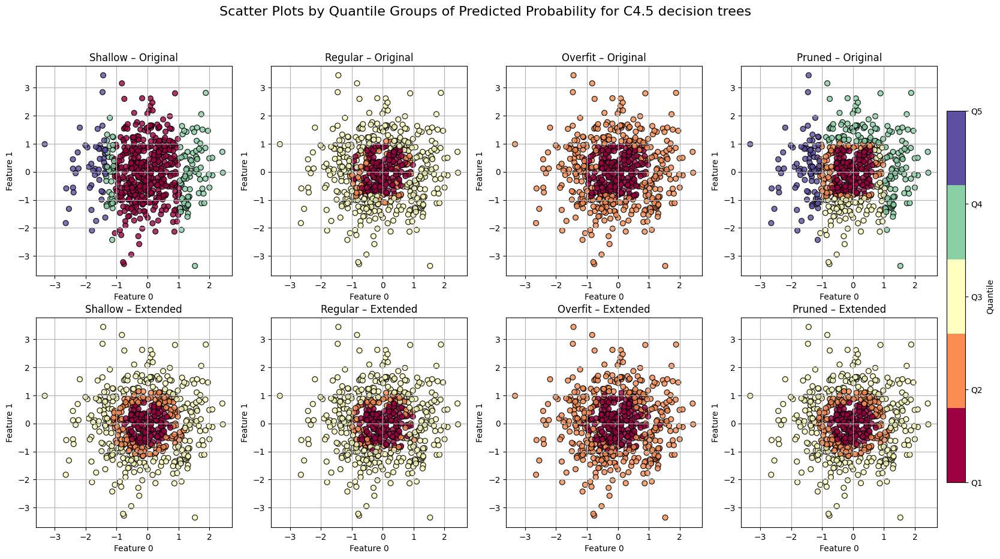

In [20]:
nq = 5
norm = mpl.colors.Normalize(vmin=0, vmax=nq-1)
cmap_name = 'Spectral'
model_labels = ["Shallow", "Regular", "Overfit", "Pruned"]

fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(20, 10))

# Top row: original (predict on X_test[:,:2])
for idx, clf in enumerate([clf_shallow, clf_regular, clf_overfit, clf_pruned]):
    y_proba = clf.predict_proba(X_test[:, :2])[:, 1]
    X_vis   = X_test[:, :2]
    ax = axes[0, idx]
    sc = calibration.plot_scatter_by_quantile(
        X_vis, y_proba,
        n_quantiles=nq,
        title=f"{model_labels[idx]} – Original",
        ax=ax,
        feature_1=0,
        feature_2=1,
        cmap=cmap_name,
        norm=norm
    )

# Bottom row: extended (predict on full X_test, but still plot [:,:2])
for idx, clf in enumerate([clf_shallow_ext, clf_regular_ext, clf_overfit_ext, clf_pruned_ext]):
    y_proba = clf.predict_proba(X_test)[:, 1]
    X_vis   = X_test[:, :2]
    ax = axes[1, idx]
    sc = calibration.plot_scatter_by_quantile(
        X_vis, y_proba,
        n_quantiles=nq,
        title=f"{model_labels[idx]} – Extended",
        ax=ax,
        feature_1=0,
        feature_2=1,
        cmap=cmap_name,
        norm=norm
    )

# one shared colorbar via an “empty” ScalarMappable
sm = mpl.cm.ScalarMappable(norm=norm, cmap=mpl.cm.get_cmap(cmap_name, nq))
sm.set_array([])  # no data needed

cbar = fig.colorbar(
    sm,
    ax=axes,
    orientation='vertical',
    fraction=0.02,
    pad=0.01
)
cbar.set_label("Quantile")
cbar.set_ticks(np.arange(nq))
cbar.set_ticklabels([f"Q{i+1}" for i in range(nq)])

fig.suptitle("Scatter Plots by Quantile Groups of Predicted Probability for C4.5 decision trees", fontsize=16)
plt.show()

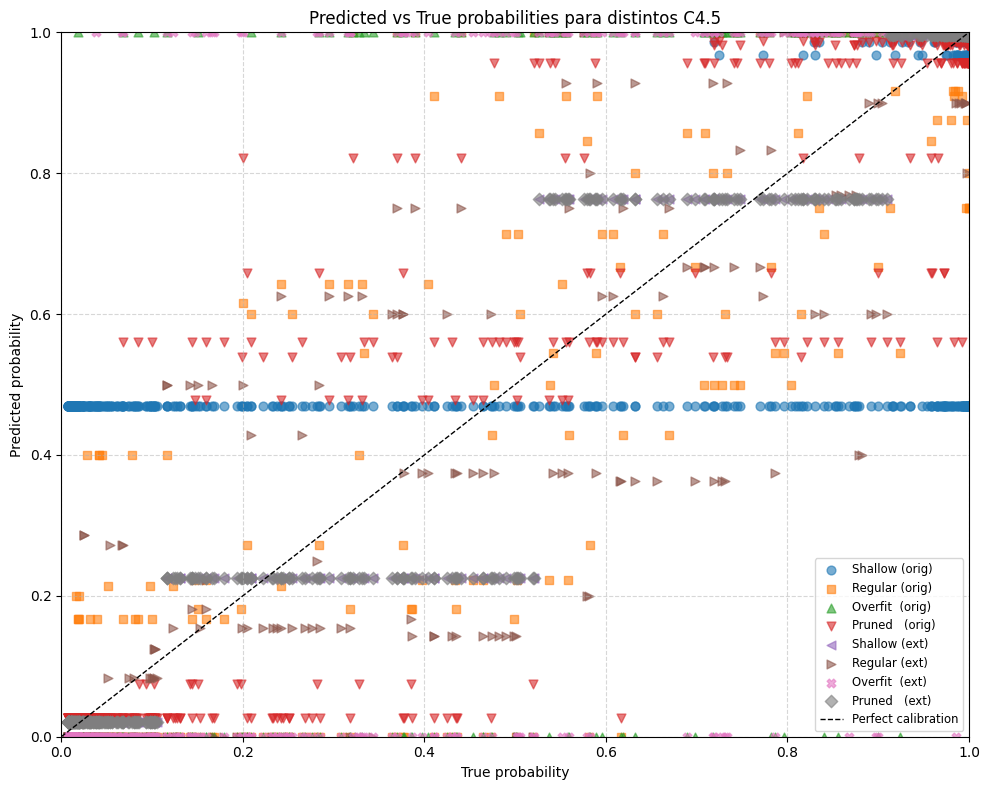

In [ ]:
# ——— 1. Recoge todas las predicciones en un diccionario ———
models = {
    "Shallow (orig)": clf_shallow,
    "Regular (orig)": clf_regular,
    "Overfit  (orig)": clf_overfit,
    "Pruned   (orig)": clf_pruned,
    "Shallow (ext)" : clf_shallow_ext,
    "Regular (ext)" : clf_regular_ext,
    "Overfit  (ext)" : clf_overfit_ext,
    "Pruned   (ext)" : clf_pruned_ext,
}

preds = {}
for name, clf in models.items():
    # si es “orig” usamos sólo las dos primeras columnas
    if "(orig)" in name:
        X_in = X_test[:, :2]
    else:
        X_in = X_test
    preds[name] = clf.predict_proba(X_in)[:, 1]

# ——— 2. Grafica todo en un mismo scatter ———
plt.figure(figsize=(10, 8))

markers = ['o','s','^','v','<','>','X','D']  # uno distinto para cada
for (name, y_pred), m in zip(preds.items(), markers):
    plt.scatter(
        p_true,         # eje x = prob real
        y_pred,         # eje y = prob predicha
        alpha=0.6,
        s=40,
        marker=m,
        label=name
    )

# línea y = x
lims = [0.0, 1.0]
plt.plot(lims, lims, 'k--', linewidth=1, label="Perfect calibration")

plt.xlabel("True probability")
plt.ylabel("Predicted probability")
plt.title("Predicted vs True probabilities para distintos C4.5")
plt.xlim(lims)
plt.ylim(lims)
plt.grid(True, linestyle='--', alpha=0.5)
plt.legend(loc='lower right', fontsize='small')
plt.tight_layout()
plt.show()


### LMT Version 1

Shallow Tree (No Pruning) → Accuracy: 0.6117, AUC: 0.5186, Log Loss: 0.6336
Regular Tree (No Pruning) → Accuracy: 0.7767, AUC: 0.9209, Log Loss: 1.1947
Overfit Tree (No Pruning) → Accuracy: 0.8250, AUC: 0.8857, Log Loss: 2.8086
Regular Tree (With Pruning) → Accuracy: 0.6083, AUC: 0.5293, Log Loss: 0.6673


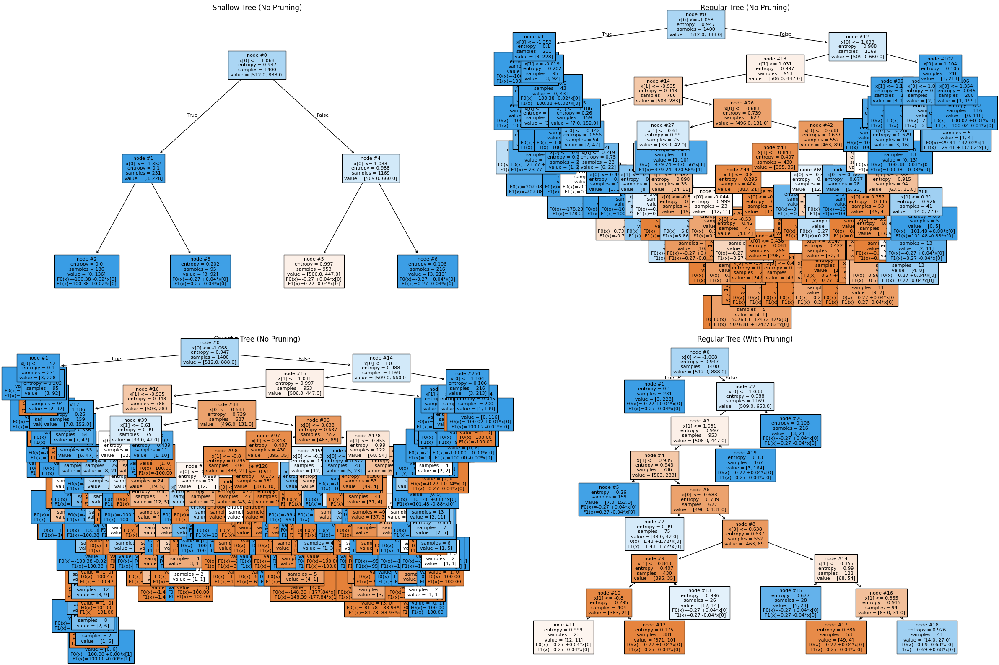

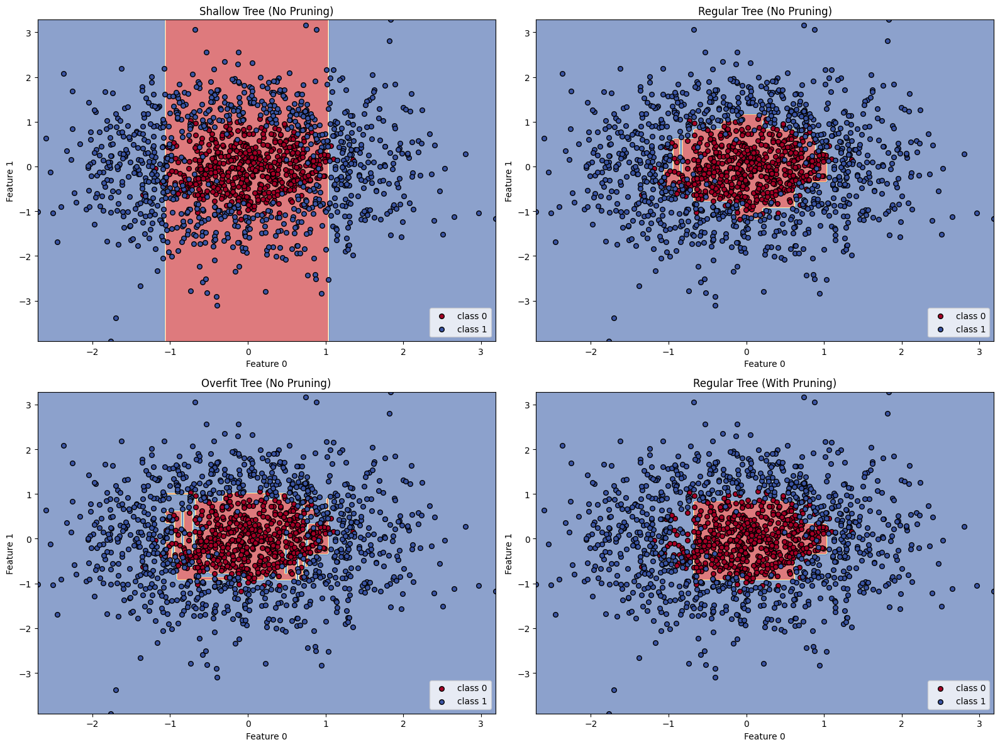

In [23]:
lmt.compare_lmt_variants(X_train[:,:2], X_test[:,:2], y_train, y_test, lmt, decision=True)

Shallow Tree (No Pruning) → Accuracy: 0.9100, AUC: 0.9725, Log Loss: 0.4496
Regular Tree (No Pruning) → Accuracy: 0.8983, AUC: 0.9240, Log Loss: 1.3142
Overfit Tree (No Pruning) → Accuracy: 0.8683, AUC: 0.8636, Log Loss: 3.2999
Regular Tree (With Pruning) → Accuracy: 0.9100, AUC: 0.9725, Log Loss: 0.4496


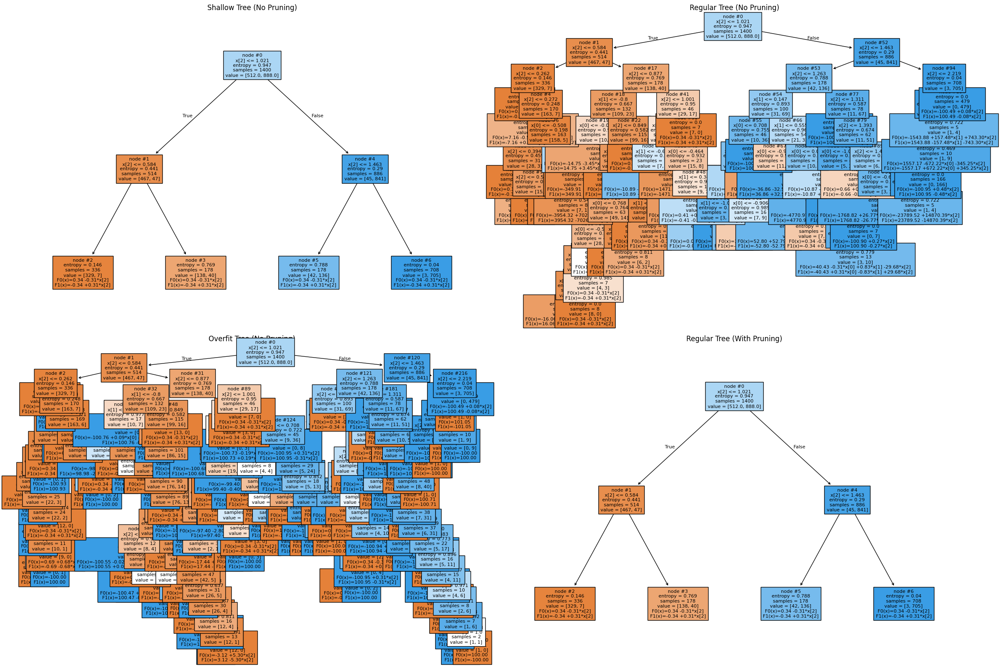

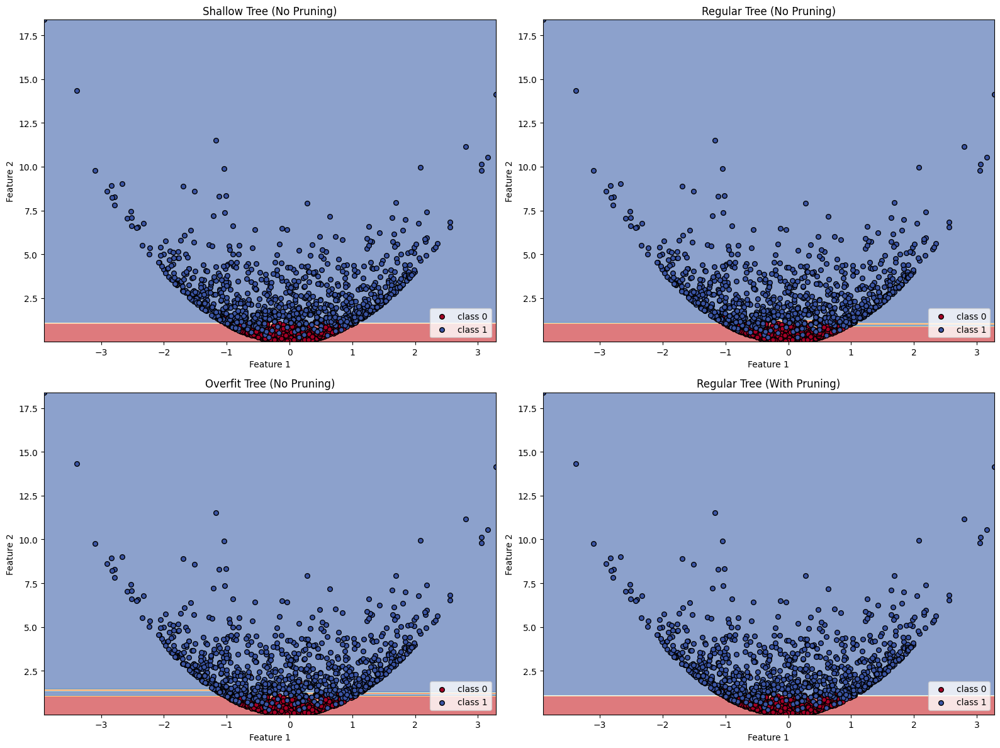

In [24]:
lmt.compare_lmt_variants(X_train, X_test, y_train, y_test, lmt, decision=True, feature_pair=(1,2))

In [26]:
clf_shallow, nodes_shallow     = lmt.fit_logistic_model_tree(X_train[:,:2],     y_train,     size='shallow', pruning=False)
print('shallow (original) done')
clf_regular, nodes_regular     = lmt.fit_logistic_model_tree(X_train[:,:2],     y_train,     size='regular', pruning=False)
print('regular (original) done')
clf_overfit, nodes_overfit     = lmt.fit_logistic_model_tree(X_train[:,:2],     y_train,     size='overfit', pruning=False)
print('overfit (original) done')
clf_pruned, nodes_pruned      = lmt.fit_logistic_model_tree(X_train[:,:2],     y_train,     size='regular', pruning=True)
print('pruned (original) done')

clf_shallow_ext, nodes_shallow_ext = lmt.fit_logistic_model_tree(X_train, y_train, size='shallow', pruning=False)
print('shallow (extended) done')
clf_regular_ext, nodes_regular_ext = lmt.fit_logistic_model_tree(X_train, y_train, size='regular', pruning=False)
print('regular (extended) done')
clf_overfit_ext, nodes_overfit_ext = lmt.fit_logistic_model_tree(X_train, y_train, size='overfit', pruning=False)
print('overfit (extended) done')
clf_pruned_ext, nodes_pruned_ext  = lmt.fit_logistic_model_tree(X_train, y_train, size='regular', pruning=True)
print('pruned (extended) done')

shallow (original) done
regular (original) done
overfit (original) done
pruned (original) done
shallow (extended) done
regular (extended) done
overfit (extended) done
pruned (extended) done


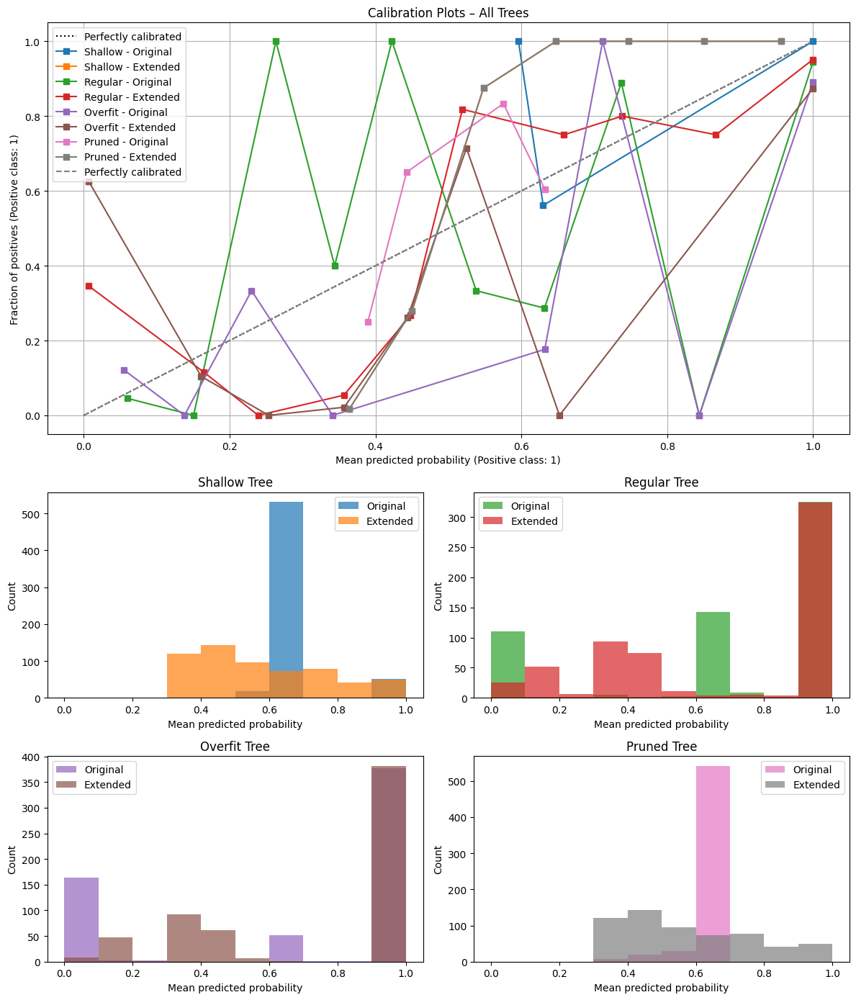

In [31]:
# Call the plotting function
calibration.plot_lmt_combined_calibration_and_hists(
    X_test[:,:2], y_test,
    X_test, y_test,
    clfs=[clf_shallow, clf_regular, clf_overfit, clf_pruned],
    nodes=[nodes_shallow, nodes_regular, nodes_overfit, nodes_pruned],
    clfs_ext=[clf_shallow_ext, clf_regular_ext, clf_overfit_ext, clf_pruned_ext],
    nodes_ext=[nodes_shallow_ext, nodes_regular_ext, nodes_overfit_ext, nodes_pruned_ext],
    model_labels=["Shallow", "Regular", "Overfit", "Pruned"]
)

C:\Users\allis\AppData\Local\Temp\ipykernel_15168\3347926498.py:47: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  sm = mpl.cm.ScalarMappable(norm=norm, cmap=mpl.cm.get_cmap(cmap_name, nq))


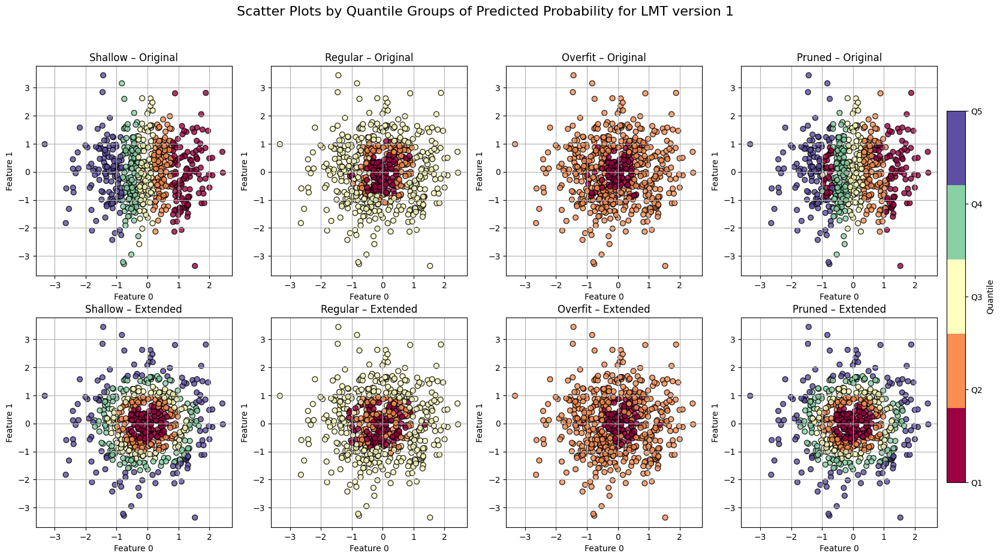

In [33]:
nq = 5
norm = mpl.colors.Normalize(vmin=0, vmax=nq-1)
cmap_name = 'Spectral'
model_labels = ["Shallow", "Regular", "Overfit", "Pruned"]

fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(20, 10))

# Top row: original (predict on X_test[:,:2])
for idx, (clf, node_model) in enumerate(zip(
    [clf_shallow, clf_regular, clf_overfit, clf_pruned],
    [nodes_shallow, nodes_regular, nodes_overfit, nodes_pruned]
)):
    y_proba = lmt.predict_proba_lmt(X_test[:, :2], clf, node_model)
    X_vis   = X_test[:, :2]
    ax = axes[0, idx]
    sc = calibration.plot_scatter_by_quantile(
        X_vis, y_proba,
        n_quantiles=nq,
        title=f"{model_labels[idx]} – Original",
        ax=ax,
        feature_1=0,
        feature_2=1,
        cmap=cmap_name,
        norm=norm
    )

# Bottom row: extended (predict on full X_test, but still plot [:,:2])
for idx, (clf, node_model) in enumerate(zip(
    [clf_shallow_ext, clf_regular_ext, clf_overfit_ext, clf_pruned_ext],
    [nodes_shallow_ext, nodes_regular_ext, nodes_overfit_ext, nodes_pruned_ext]
)):
    y_proba = lmt.predict_proba_lmt(X_test, clf, node_model)
    X_vis   = X_test[:, :2]
    ax = axes[1, idx]
    sc = calibration.plot_scatter_by_quantile(
        X_vis, y_proba,
        n_quantiles=nq,
        title=f"{model_labels[idx]} – Extended",
        ax=ax,
        feature_1=0,
        feature_2=1,
        cmap=cmap_name,
        norm=norm
    )

# one shared colorbar via an “empty” ScalarMappable
sm = mpl.cm.ScalarMappable(norm=norm, cmap=mpl.cm.get_cmap(cmap_name, nq))
sm.set_array([])  # no data needed

cbar = fig.colorbar(
    sm,
    ax=axes,
    orientation='vertical',
    fraction=0.02,
    pad=0.01
)
cbar.set_label("Quantile")
cbar.set_ticks(np.arange(nq))
cbar.set_ticklabels([f"Q{i+1}" for i in range(nq)])

fig.suptitle("Scatter Plots by Quantile Groups of Predicted Probability for LMT version 1", fontsize=16)
plt.show()

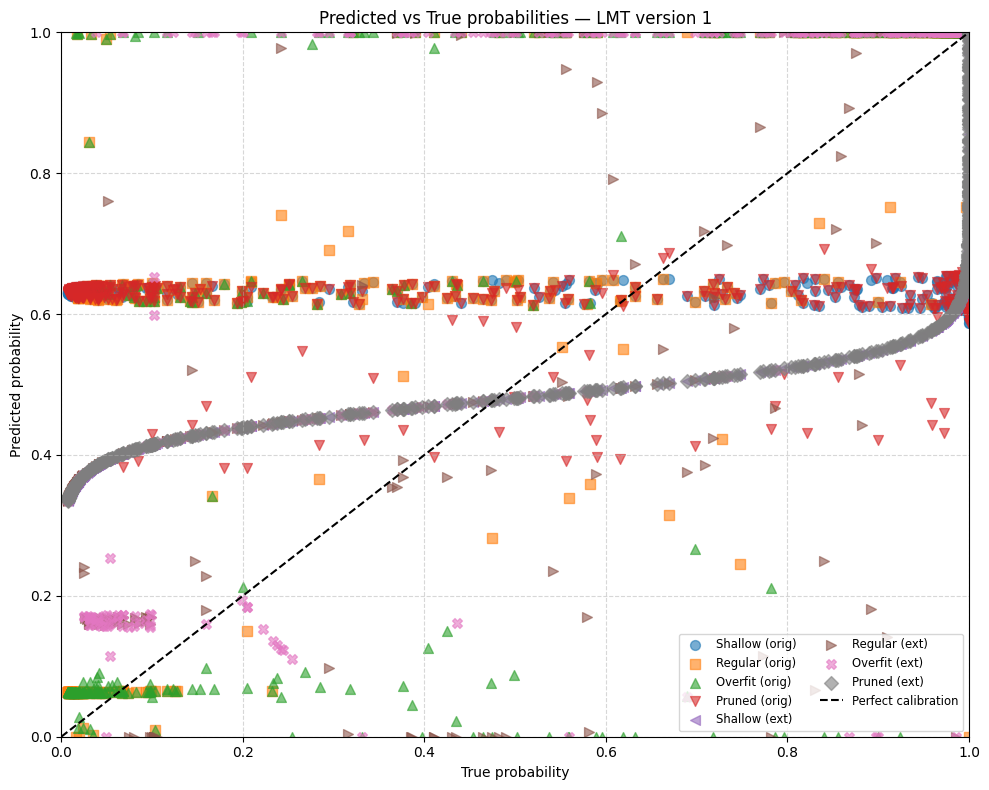

In [36]:
models = {
    "Shallow (orig)":   (clf_shallow,     nodes_shallow,     X_test[:, :2]),
    "Regular (orig)":   (clf_regular,     nodes_regular,     X_test[:, :2]),
    "Overfit (orig)":   (clf_overfit,     nodes_overfit,     X_test[:, :2]),
    "Pruned (orig)":    (clf_pruned,      nodes_pruned,      X_test[:, :2]),
    "Shallow (ext)":    (clf_shallow_ext, nodes_shallow_ext, X_test),
    "Regular (ext)":    (clf_regular_ext, nodes_regular_ext, X_test),
    "Overfit (ext)":    (clf_overfit_ext, nodes_overfit_ext, X_test),
    "Pruned (ext)":     (clf_pruned_ext,  nodes_pruned_ext,  X_test),
}


markers = ['o','s','^','v','<','>','X','D']


plt.figure(figsize=(10,8))

for (name, (clf, nodes, X_in)), m in zip(models.items(), markers):
    # get predicted prob
    y_pred = lmt.predict_proba_lmt(X_in, clf, nodes)
    plt.scatter(
        p_true,       # eje x: prob real
        y_pred,       # eje y: prob predicha
        alpha=0.6,
        s=50,
        marker=m,
        label=name
    )

# perfect calibration
lims = [0.0, 1.0]
plt.plot(lims, lims, 'k--', label="Perfect calibration")

# graph
plt.xlabel("True probability")
plt.ylabel("Predicted probability")
plt.title("Predicted vs True probabilities — LMT version 1")
plt.xlim(lims)
plt.ylim(lims)
plt.grid(True, linestyle='--', alpha=0.5)
plt.legend(loc='lower right', fontsize='small', ncol=2)
plt.tight_layout()
plt.show()


### LMT version 2

In [27]:
def compare_lmt_variants_v2(X_train, X_test, y_train, y_test, lmt, decision=True, feature_pair=(0,1)):
    """
    Trains and evaluates four logistic model trees using different sizes and pruning strategies.
    Plots the tree structure and prints evaluation metrics.
    
    Parameters
    ----------
    X_train, X_test : pd.DataFrame or np.ndarray
        Training and test feature sets.
    y_train, y_test : pd.Series or np.ndarray
        Training and test labels.
    lmt : module or object
        Module or object that provides the `construct_tree` method.
    """
    
    configs = [
        ('shallow', False, "Shallow Tree (No Pruning)"),
        ('regular', False, "Regular Tree (No Pruning)"),
        ('overfit', False, "Overfit Tree (No Pruning)"),
        ('regular', True,  "Regular Tree (With Pruning)")
    ]

    fitted = []

    # Tree construction
    for size, pruning, label in configs:
        clf_tree, node_models = lmt.fit_logistic_model_tree_v2(X_train, y_train, size=size, pruning=pruning)
        #print(node_models)
        # Hard predictions
        y_pred = lmt.predict_lmt(X_test, clf_tree, node_models)
        # 3) extract per‐sample proba. of class 1
        y_prob = lmt.predict_proba_lmt(X_test, clf_tree, node_models)

        # 4) metrics
        acc  = accuracy_score(y_test, y_pred)
        auc  = roc_auc_score(y_test, y_prob)
        loss = log_loss(y_test, y_prob)
        print(f"{label} → Accuracy: {acc:.4f}, AUC: {auc:.4f}, Log Loss: {loss:.4f}")
        
        fitted.append((clf_tree, node_models, label))

    # Plotting all four trees
    fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(24, 16))
    axes = axes.flatten()

    # Plotting all four trees
    for i, (clf_tree, node_models, label) in enumerate(fitted):
        lmt.plot_tree_with_linear_models(
            clf_tree=clf_tree,
            node_models=node_models,
            X=X_train,
            title=label,
            ax=axes[i]  # Use subplot axis
        )

    if decision:
        # Plotting decision surfaces of all four trees
        fig, axes = plt.subplots(2, 2, figsize=(16, 12))
        for ax, (clf_tree, _, label) in zip(axes.ravel(), fitted):
            lmt.plot_decision_surface_from_fitted_tree(
                clf_tree=clf_tree,
                X=X_train,
                feature_pair=feature_pair,
                y=y_train,
                fixed_vals=None,
                grid_steps=200,
                cmap='RdYlBu',
                ax=ax,
                title=label
            )
        plt.tight_layout()
        plt.show()

Shallow Tree (No Pruning) → Accuracy: 0.6083, AUC: 0.7094, Log Loss: 0.6262
Regular Tree (No Pruning) → Accuracy: 0.8200, AUC: 0.7066, Log Loss: 4.1550
Overfit Tree (No Pruning) → Accuracy: 0.8200, AUC: 0.7375, Log Loss: 3.8597
Regular Tree (With Pruning) → Accuracy: 0.7433, AUC: 0.6534, Log Loss: 1.4585


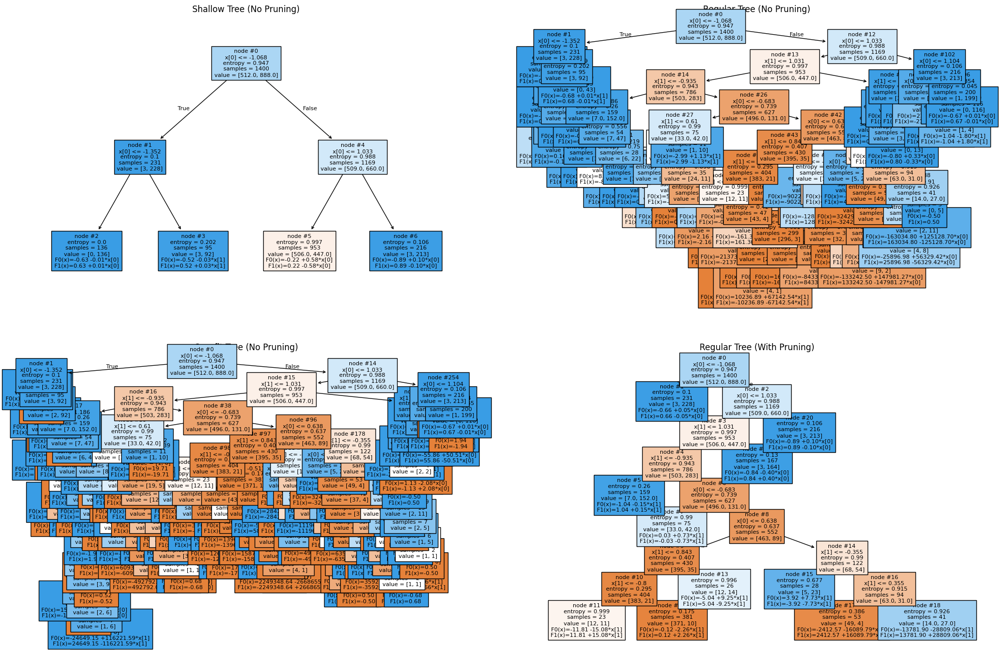

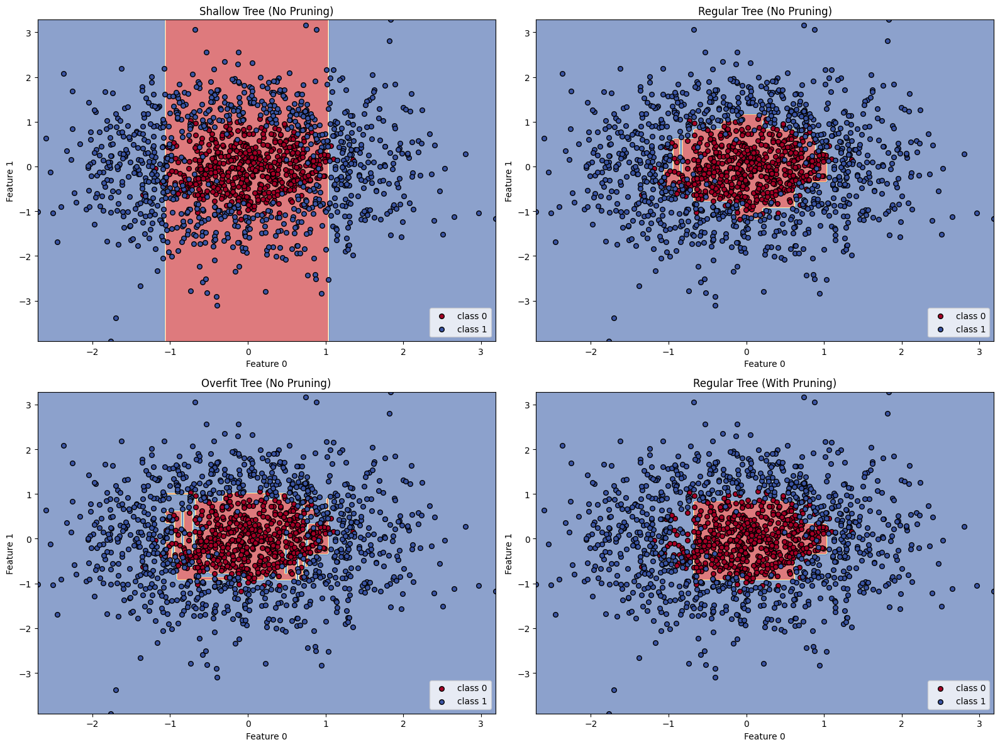

In [28]:
compare_lmt_variants_v2(X_train[:,:2], X_test[:,:2], y_train, y_test, lmt, decision=True)

Shallow Tree (No Pruning) → Accuracy: 0.9067, AUC: 0.9724, Log Loss: 0.2107
Regular Tree (No Pruning) → Accuracy: 0.8583, AUC: 0.9061, Log Loss: 0.4688
Overfit Tree (No Pruning) → Accuracy: 0.8617, AUC: 0.7856, Log Loss: 0.9300
Regular Tree (With Pruning) → Accuracy: 0.9067, AUC: 0.9724, Log Loss: 0.2107


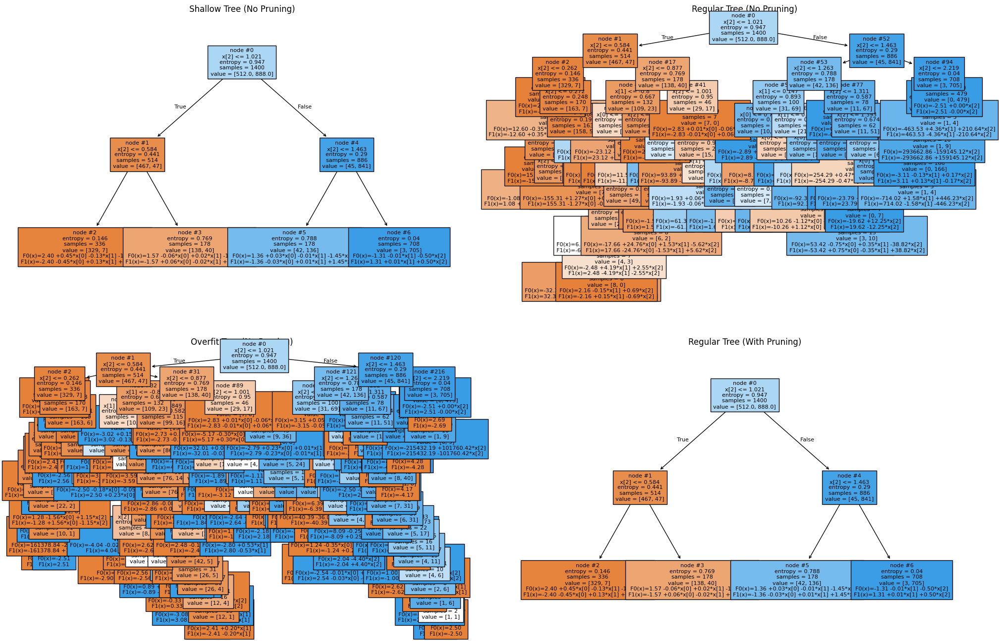

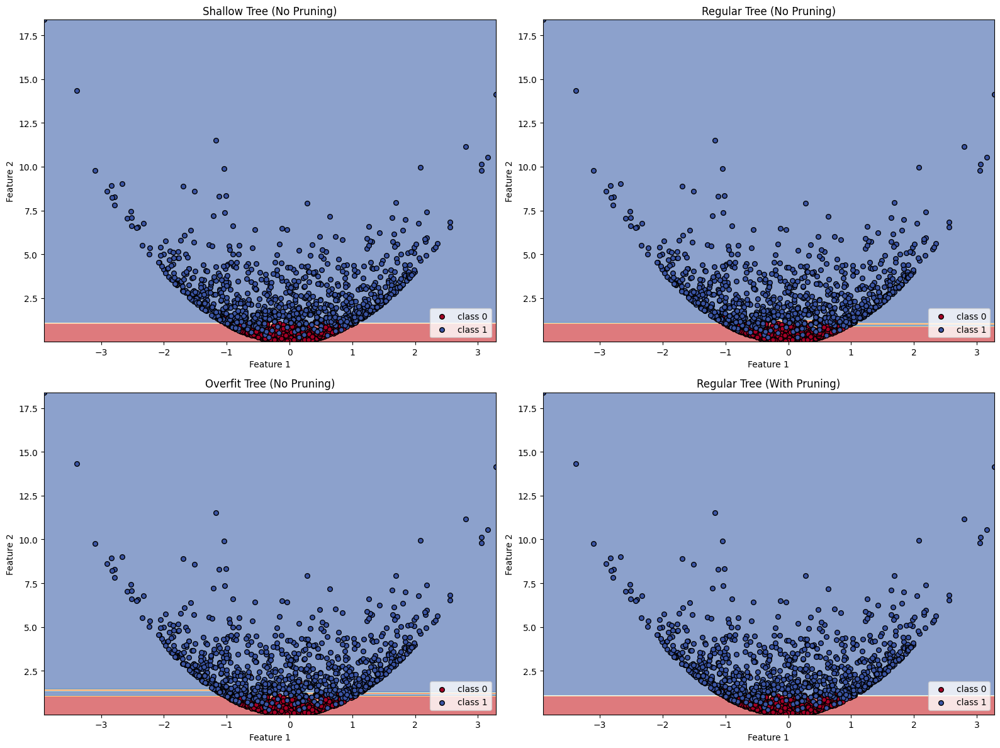

In [29]:
compare_lmt_variants_v2(X_train, X_test, y_train, y_test, lmt, decision=True, feature_pair=(1,2))

In [13]:
clf_shallow2, nodes_shallow2     = lmt.fit_logistic_model_tree_v2(X_train[:,:2],     y_train,     size='shallow', pruning=False)
print('shallow (original) done')
clf_regular2, nodes_regular2     = lmt.fit_logistic_model_tree_v2(X_train[:,:2],     y_train,     size='regular', pruning=False)
print('regular (original) done')
clf_overfit2, nodes_overfit2     = lmt.fit_logistic_model_tree_v2(X_train[:,:2],     y_train,     size='overfit', pruning=False)
print('overfit (original) done')
clf_pruned2, nodes_pruned2      = lmt.fit_logistic_model_tree_v2(X_train[:,:2],     y_train,     size='regular', pruning=True)
print('pruned (original) done')

clf_shallow_ext2, nodes_shallow_ext2 = lmt.fit_logistic_model_tree_v2(X_train, y_train, size='shallow', pruning=False)
print('shallow (extended) done')
clf_regular_ext2, nodes_regular_ext2 = lmt.fit_logistic_model_tree_v2(X_train, y_train, size='regular', pruning=False)
print('regular (extended) done')
clf_overfit_ext2, nodes_overfit_ext2 = lmt.fit_logistic_model_tree_v2(X_train, y_train, size='overfit', pruning=False)
print('overfit (extended) done')
clf_pruned_ext2, nodes_pruned_ext2  = lmt.fit_logistic_model_tree_v2(X_train, y_train, size='regular', pruning=True)
print('pruned (extended) done')


shallow (original) done
regular (original) done
overfit (original) done
pruned (original) done
shallow (extended) done
regular (extended) done
overfit (extended) done
pruned (extended) done


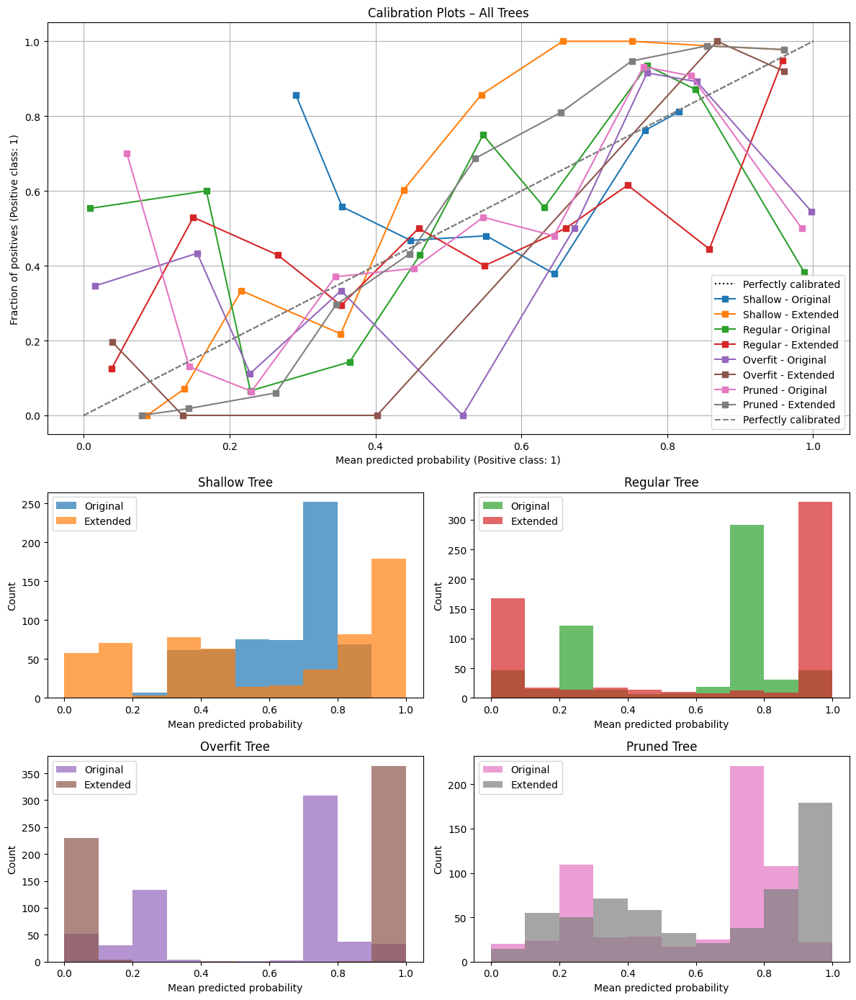

In [14]:
# Call the plotting function
calibration.plot_lmt_combined_calibration_and_hists(
    X_test[:,:2], y_test,
    X_test, y_test,
    clfs=[clf_shallow2, clf_regular2, clf_overfit2, clf_pruned2],
    nodes=[nodes_shallow2, nodes_regular2, nodes_overfit2, nodes_pruned2],
    clfs_ext=[clf_shallow_ext2, clf_regular_ext2, clf_overfit_ext2, clf_pruned_ext2],
    nodes_ext=[nodes_shallow_ext2, nodes_regular_ext2, nodes_overfit_ext2, nodes_pruned_ext2],
    model_labels=["Shallow", "Regular", "Overfit", "Pruned"]
)

C:\Users\allis\AppData\Local\Temp\ipykernel_15168\1467409436.py:47: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  sm = mpl.cm.ScalarMappable(norm=norm, cmap=mpl.cm.get_cmap(cmap_name, nq))


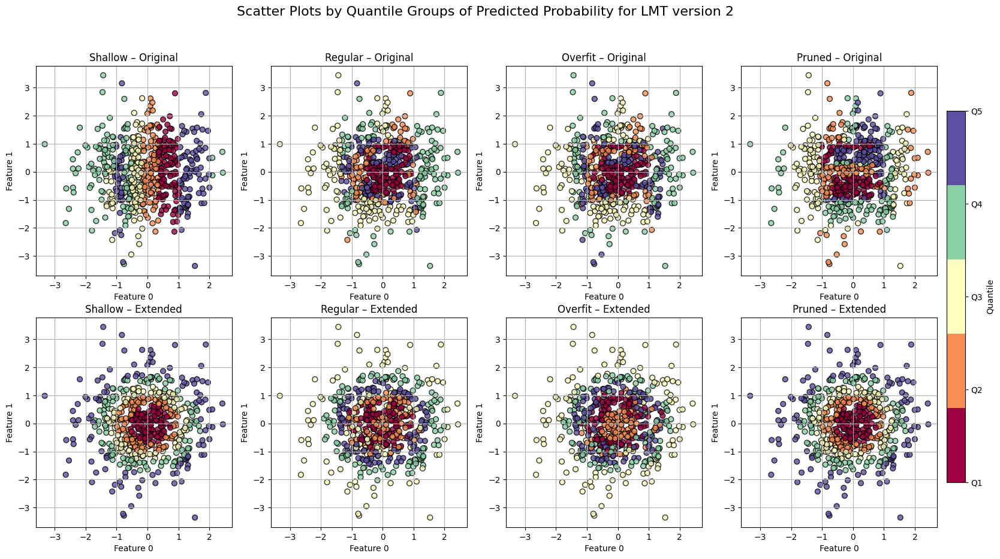

In [34]:
nq = 5
norm = mpl.colors.Normalize(vmin=0, vmax=nq-1)
cmap_name = 'Spectral'
model_labels = ["Shallow", "Regular", "Overfit", "Pruned"]

fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(20, 10))

# Top row: original (predict on X_test[:,:2])
for idx, (clf, node_model) in enumerate(zip(
    [clf_shallow2, clf_regular2, clf_overfit2, clf_pruned2],
    [nodes_shallow2, nodes_regular2, nodes_overfit2, nodes_pruned2]
)):
    y_proba = lmt.predict_proba_lmt(X_test[:, :2], clf, node_model)
    X_vis   = X_test[:, :2]
    ax = axes[0, idx]
    sc = calibration.plot_scatter_by_quantile(
        X_vis, y_proba,
        n_quantiles=nq,
        title=f"{model_labels[idx]} – Original",
        ax=ax,
        feature_1=0,
        feature_2=1,
        cmap=cmap_name,
        norm=norm
    )

# Bottom row: extended (predict on full X_test, but still plot [:,:2])
for idx, (clf, node_model) in enumerate(zip(
    [clf_shallow_ext2, clf_regular_ext2, clf_overfit_ext2, clf_pruned_ext2],
    [nodes_shallow_ext2, nodes_regular_ext2, nodes_overfit_ext2, nodes_pruned_ext2]
)):
    y_proba = lmt.predict_proba_lmt(X_test, clf, node_model)
    X_vis   = X_test[:, :2]
    ax = axes[1, idx]
    sc = calibration.plot_scatter_by_quantile(
        X_vis, y_proba,
        n_quantiles=nq,
        title=f"{model_labels[idx]} – Extended",
        ax=ax,
        feature_1=0,
        feature_2=1,
        cmap=cmap_name,
        norm=norm
    )

# one shared colorbar via an “empty” ScalarMappable
sm = mpl.cm.ScalarMappable(norm=norm, cmap=mpl.cm.get_cmap(cmap_name, nq))
sm.set_array([])  # no data needed

cbar = fig.colorbar(
    sm,
    ax=axes,
    orientation='vertical',
    fraction=0.02,
    pad=0.01
)
cbar.set_label("Quantile")
cbar.set_ticks(np.arange(nq))
cbar.set_ticklabels([f"Q{i+1}" for i in range(nq)])

fig.suptitle("Scatter Plots by Quantile Groups of Predicted Probability for LMT version 2", fontsize=16)
plt.show()

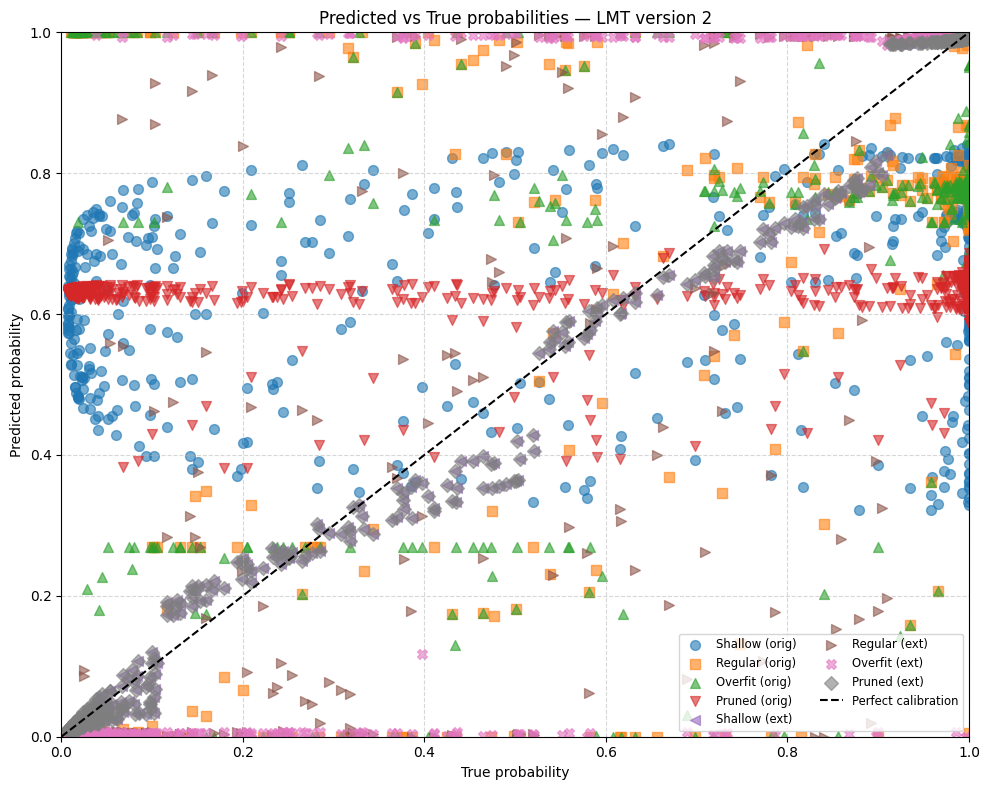

In [37]:
models = {
    "Shallow (orig)":   (clf_shallow2,     nodes_shallow2,     X_test[:, :2]),
    "Regular (orig)":   (clf_regular2,     nodes_regular2,     X_test[:, :2]),
    "Overfit (orig)":   (clf_overfit2,     nodes_overfit2,     X_test[:, :2]),
    "Pruned (orig)":    (clf_pruned2,      nodes_pruned,      X_test[:, :2]),
    "Shallow (ext)":    (clf_shallow_ext2, nodes_shallow_ext2, X_test),
    "Regular (ext)":    (clf_regular_ext2, nodes_regular_ext2, X_test),
    "Overfit (ext)":    (clf_overfit_ext2, nodes_overfit_ext2, X_test),
    "Pruned (ext)":     (clf_pruned_ext2,  nodes_pruned_ext2,  X_test),
}


markers = ['o','s','^','v','<','>','X','D']


plt.figure(figsize=(10,8))

for (name, (clf, nodes, X_in)), m in zip(models.items(), markers):
    # get predicted prob
    y_pred = lmt.predict_proba_lmt(X_in, clf, nodes)
    plt.scatter(
        p_true,       # eje x: prob real
        y_pred,       # eje y: prob predicha
        alpha=0.6,
        s=50,
        marker=m,
        label=name
    )

# perfect calibration
lims = [0.0, 1.0]
plt.plot(lims, lims, 'k--', label="Perfect calibration")

# graph
plt.xlabel("True probability")
plt.ylabel("Predicted probability")
plt.title("Predicted vs True probabilities — LMT version 2")
plt.xlim(lims)
plt.ylim(lims)
plt.grid(True, linestyle='--', alpha=0.5)
plt.legend(loc='lower right', fontsize='small', ncol=2)
plt.tight_layout()
plt.show()
